# The Sparks Foundation internship
# Data Science and Business Analytics
# Name: Srideep Bhattacharya
# As a security/defense analyst,try to find out the hot zone of terrorism.What all security issues and insights you can derive by EDA?

# Importing packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px

In [2]:
df=pd.read_csv("globalterrorismdb_0718dist.csv") #reading dataset

In [3]:
df.shape #dimensions

(181691, 135)

In [4]:
df.head(10) #first 10 rows

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,1.970000e+11,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,1.970000e+11,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,1.970010e+11,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,1.970010e+11,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,1.970010e+11,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
5,1.970010e+11,1970,1,1,NaN,0,NaN,217,United States,1,...,"The Cairo Chief of Police, William Petersen, r...","""Police Chief Quits,"" Washington Post, January...","""Cairo Police Chief Quits; Decries Local 'Mili...","Christopher Hewitt, ""Political Violence and Te...",Hewitt Project,-9,-9,0,-9,NaN
6,1.970010e+11,1970,1,2,NaN,0,NaN,218,Uruguay,3,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
7,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,"Damages were estimated to be between $20,000-$...",Committee on Government Operations United Stat...,"Christopher Hewitt, ""Political Violence and Te...",NaN,Hewitt Project,-9,-9,0,-9,NaN
8,1.970010e+11,1970,1,2,NaN,0,NaN,217,United States,1,...,The New Years Gang issue a communiqué to a loc...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...","The Wisconsin Cartographers' Guild, ""Wisconsin...",Hewitt Project,0,0,0,0,NaN
9,1.970010e+11,1970,1,3,NaN,0,NaN,217,United States,1,...,"Karl Armstrong's girlfriend, Lynn Schultz, dro...",Committee on Government Operations United Stat...,"Tom Bates, ""Rads: The 1970 Bombing of the Army...","David Newman, Sandra Sutherland, and Jon Stewa...",Hewitt Project,0,0,0,0,NaN


In [5]:
df.info() #Info about dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(56), int64(21), object(58)
memory usage: 187.1+ MB


In [6]:
df.isnull().sum() #checking for null values

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [7]:
df.corr() #coorelation among attributes

,eventid,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
eventid,1.000000,0.999996,0.002705,0.018270,0.091762,-0.135039,0.401371,0.166886,0.003907,0.030641,...,-0.009991,-0.017999,-0.014094,-0.165422,0.256114,-0.181613,-0.143600,-0.133252,-0.077851,-0.175606
iyear,0.999996,1.000000,0.000139,0.018254,0.091754,-0.135023,0.401384,0.166933,0.003917,0.030626,...,-0.009984,-0.018216,-0.014238,-0.165375,0.256092,-0.181556,-0.143601,-0.133253,-0.077847,-0.175596
imonth,0.002705,0.000139,1.000000,0.005497,-0.000468,-0.006305,-0.002999,-0.015978,-0.003880,0.003621,...,-0.000710,0.046989,0.058878,-0.016597,0.011295,-0.011535,-0.002302,-0.002034,-0.002554,-0.006336
iday,0.018270,0.018254,0.005497,1.000000,-0.004700,0.003468,0.009710,0.003423,-0.002285,-0.006991,...,0.012755,-0.010502,0.003148,-0.006581,-0.006706,0.001765,-0.001540,-0.001621,-0.002027,-0.001199
extended,0.091762,0.091754,-0.000468,-0.004700,1.000000,-0.020466,0.038389,-0.024749,0.000523,0.057897,...,-0.008114,0.028177,0.001966,0.009367,0.233293,-0.192155,0.071768,0.075147,0.027335,0.080767
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
nreleased,-0.181613,-0.181556,-0.011535,0.001765,-0.192155,-0.044331,-0.149511,0.002790,-0.017745,-0.030631,...,0.054571,0.034843,0.049322,0.016832,-0.555478,1.000000,0.039388,0.040947,0.085055,0.064759
INT_LOG,-0.143600,-0.143601,-0.002302,-0.001540,0.071768,0.069904,-0.082584,-0.099827,0.002272,0.073022,...,0.035821,0.031079,0.007029,-0.045504,-0.015442,0.039388,1.000000,0.996211,0.052537,0.891051
INT_IDEO,-0.133252,-0.133253,-0.002034,-0.001621,0.075147,0.067564,-0.071917,-0.094470,0.002268,0.071333,...,0.039053,0.041983,0.013162,-0.039844,-0.016234,0.040947,0.996211,1.000000,0.082014,0.893811
INT_MISC,-0.077851,-0.077847,-0.002554,-0.002027,0.027335,0.207281,0.043139,0.097652,0.000371,-0.019197,...,0.023815,0.125162,0.037227,0.129274,-0.119776,0.085055,0.052537,0.082014,1.000000,0.252193


In [8]:
df.drop(columns=['eventid'],inplace=True) #Dropping as no help in analysing it

In [9]:
df.columns.values

array(['iyear', 'imonth', 'iday', 'approxdate', 'extended', 'resolution',
       'country', 'country_txt', 'region', 'region_txt', 'provstate',
       'city', 'latitude', 'longitude', 'specificity', 'vicinity',
       'location', 'summary', 'crit1', 'crit2', 'crit3', 'doubtterr',
       'alternative', 'alternative_txt', 'multiple', 'success', 'suicide',
       'attacktype1', 'attacktype1_txt', 'attacktype2', 'attacktype2_txt',
       'attacktype3', 'attacktype3_txt', 'targtype1', 'targtype1_txt',
       'targsubtype1', 'targsubtype1_txt', 'corp1', 'target1', 'natlty1',
       'natlty1_txt', 'targtype2', 'targtype2_txt', 'targsubtype2',
       'targsubtype2_txt', 'corp2', 'target2', 'natlty2', 'natlty2_txt',
       'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt',
       'corp3', 'target3', 'natlty3', 'natlty3_txt', 'gname', 'gsubname',
       'gname2', 'gsubname2', 'gname3', 'gsubname3', 'motive',
       'guncertain1', 'guncertain2', 'guncertain3', 'individual',
       

In [10]:
df.describe() #calculating certain quantities

,iyear,imonth,iday,extended,country,region,latitude,longitude,specificity,vicinity,...,ransomamt,ransomamtus,ransompaid,ransompaidus,hostkidoutcome,nreleased,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
count,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,181691.000000,177135.000000,1.771340e+05,181685.000000,181691.000000,...,1.350000e+03,5.630000e+02,7.740000e+02,552.000000,10991.000000,10400.000000,181691.000000,181691.000000,181691.000000,181691.000000
mean,2002.638997,6.467277,15.505644,0.045346,131.968501,7.160938,23.498343,-4.586957e+02,1.451452,0.068297,...,3.172530e+06,5.784865e+05,7.179437e+05,240.378623,4.629242,-29.018269,-4.543731,-4.464398,0.090010,-3.945952
std,13.259430,3.388303,8.814045,0.208063,112.414535,2.933408,18.569242,2.047790e+05,0.995430,0.284553,...,3.021157e+07,7.077924e+06,1.014392e+07,2940.967293,2.035360,65.720119,4.543547,4.637152,0.568457,4.691325
min,1970.000000,0.000000,0.000000,0.000000,4.000000,1.000000,-53.154613,-8.618590e+07,1.000000,-9.000000,...,-9.900000e+01,-9.900000e+01,-9.900000e+01,-99.000000,1.000000,-99.000000,-9.000000,-9.000000,-9.000000,-9.000000
25%,1991.000000,4.000000,8.000000,0.000000,78.000000,5.000000,11.510046,4.545640e+00,1.000000,0.000000,...,0.000000e+00,0.000000e+00,-9.900000e+01,0.000000,2.000000,-99.000000,-9.000000,-9.000000,0.000000,-9.000000
50%,2009.000000,6.000000,15.000000,0.000000,98.000000,6.000000,31.467463,4.324651e+01,1.000000,0.000000,...,1.500000e+04,0.000000e+00,0.000000e+00,0.000000,4.000000,0.000000,-9.000000,-9.000000,0.000000,0.000000
75%,2014.000000,9.000000,23.000000,0.000000,160.000000,10.000000,34.685087,6.871033e+01,1.000000,0.000000,...,4.000000e+05,0.000000e+00,1.273412e+03,0.000000,7.000000,1.000000,0.000000,0.000000,0.000000,0.000000
max,2017.000000,12.000000,31.000000,1.000000,1004.000000,12.000000,74.633553,1.793667e+02,5.000000,1.000000,...,1.000000e+09,1.320000e+08,2.750000e+08,48000.000000,7.000000,2769.000000,1.000000,1.000000,1.000000,1.000000


In [11]:
df1=df[['iyear','imonth','country_txt','region_txt','provstate','city','nkill','nwound','attacktype1_txt','weaptype1_txt','targtype1_txt','gname','success']]
#taking certain columns in our dataset for EDA

In [12]:
df1.shape

(181691, 13)

<AxesSubplot:>

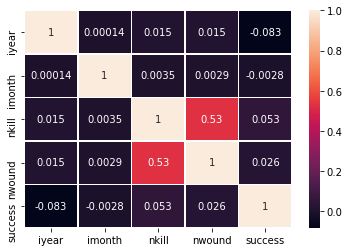

In [13]:
sns.heatmap(df1.corr(),annot=True,linewidth=0.5)
#Coorelation 

# Exploratory data analysis to draw insights

In [14]:
df1['country_txt'].value_counts().idxmax()
#Country with maximum terror attacks

'Iraq'

In [15]:
df1['region_txt'].value_counts() #Terror counts of different regions

Middle East & North Africa     50474
South Asia                     44974
South America                  18978
Sub-Saharan Africa             17550
Western Europe                 16639
Southeast Asia                 12485
Central America & Caribbean    10344
Eastern Europe                  5144
North America                   3456
East Asia                        802
Central Asia                     563
Australasia & Oceania            282
Name: region_txt, dtype: int64

In [16]:
df1['region_txt'].value_counts().idxmax() #Highest count

'Middle East & North Africa'

In [17]:
df1['attacktype1_txt'].value_counts().idxmax() #Bombing/Explosion is the preferred attack mode

'Bombing/Explosion'

In [18]:
df1['weaptype1_txt'].value_counts().idxmax() #Explosives are used the most

'Explosives'

In [19]:
df1['targtype1_txt'].value_counts().idxmax() #Private citizens and property are most vulnerable

'Private Citizens & Property'

<AxesSubplot:>

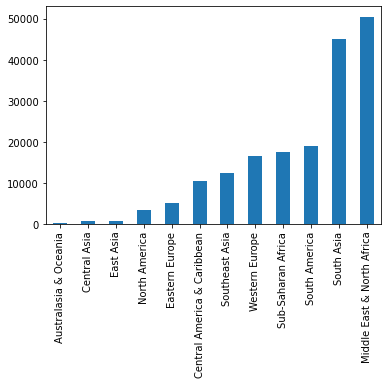

In [20]:
df1['region_txt'].value_counts().sort_values().plot.bar()
#Visual plot of terror strikes across regions

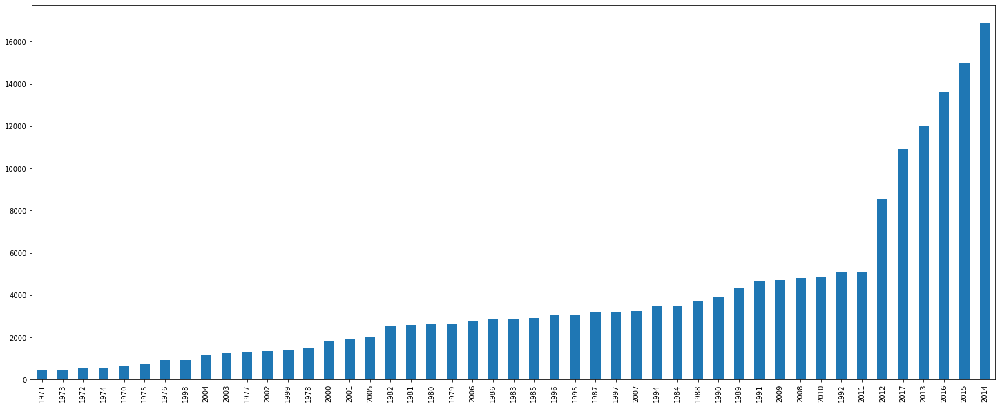

In [21]:
plt.figure(figsize=(25,10))
df1['iyear'].value_counts().sort_values().plot.bar()
plt.show()
#Year 2014 was highest in terms of count

<AxesSubplot:xlabel='iyear'>

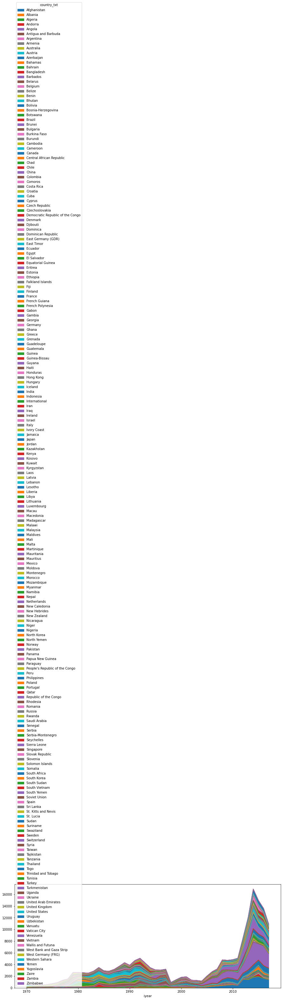

In [22]:
pd.crosstab(df1['iyear'],df1['country_txt']).plot(kind='area',figsize=(15,6))
#Visualising terror across countries in terms of area

In [23]:
df1['success'].value_counts()
#Almost all strikes were successful

1    161632
0     20059
Name: success, dtype: int64

<AxesSubplot:>

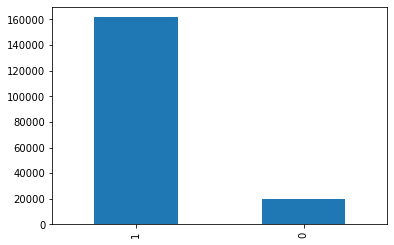

In [24]:
df1['success'].value_counts().plot(kind='bar')
#Majority were successful terror attacks with few failures

<AxesSubplot:xlabel='iyear'>

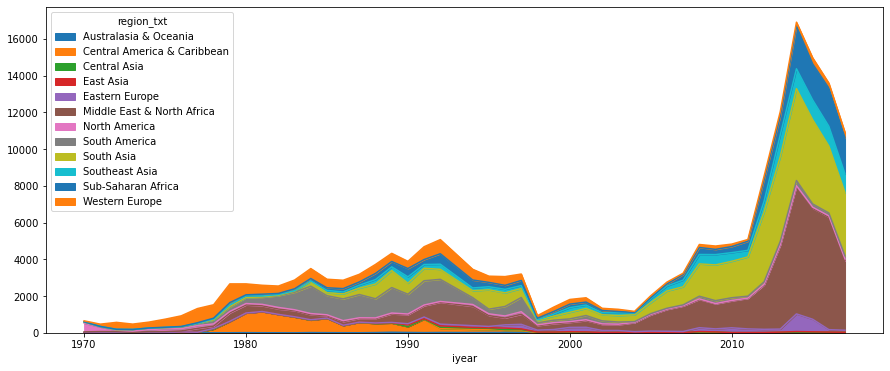

In [25]:
pd.crosstab(df1['iyear'],df1['region_txt']).plot(kind='area',figsize=(15,6))
#Visualising terror across regions in terms of area

<AxesSubplot:xlabel='iyear'>

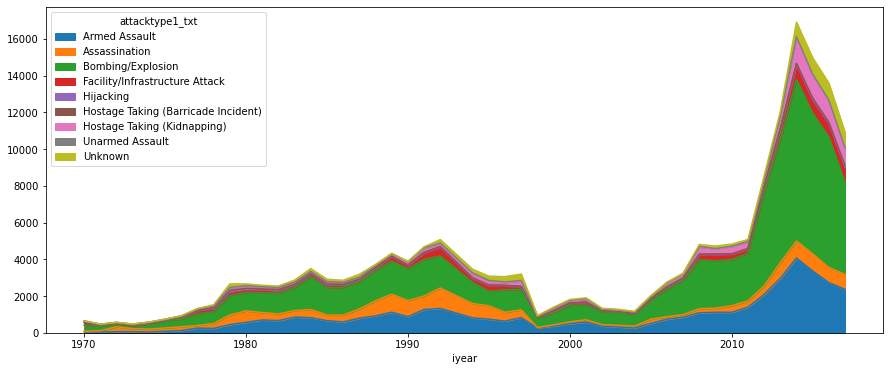

In [26]:
pd.crosstab(df1['iyear'],df1['attacktype1_txt']).plot(kind='area',figsize=(15,6))
#Visualising attack types in the course of years in terms of area

In [27]:
df1['weaptype1_txt'].isnull().sum() #Checking for missing values

0

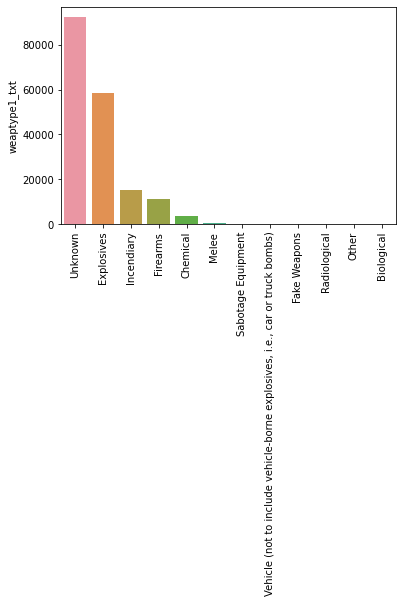

In [28]:
x1=df1['weaptype1_txt'].unique()
y1=df1['weaptype1_txt'].value_counts()
plt.xticks(rotation=90)
sns.barplot(x1,y1)
plt.show()
#Explosives were used the most.

<AxesSubplot:xlabel='iyear'>

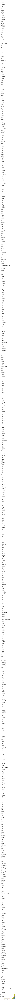

In [29]:
pd.crosstab(df1['iyear'],df1['gname']).plot(kind='area',figsize=(15,6))
#Visualising terror organisations with respect to years in terms of area

In [30]:
df1['gname'].value_counts() #Taliban is the most active organisation.

Unknown                                             82782
Taliban                                              7478
Islamic State of Iraq and the Levant (ISIL)          5613
Shining Path (SL)                                    4555
Farabundo Marti National Liberation Front (FMLN)     3351
                                                    ...  
Lebanese Terrorist Group                                1
Georgian guerrillas                                     1
Chinese Mafia                                           1
Iraqi Strugglers' Movement                              1
Banner of Islam                                         1
Name: gname, Length: 3537, dtype: int64

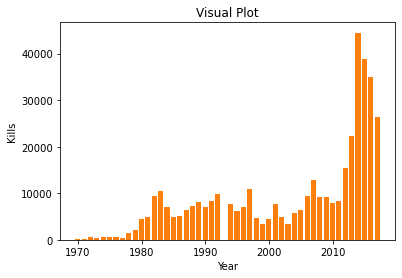

In [31]:
x1=df1['iyear'].unique()
y1=df1.groupby('iyear')['nkill'].sum()
plt.bar(x1,y1,color='tab:orange')
plt.xlabel('Year')
plt.ylabel('Kills')
plt.title('Visual Plot')
plt.show()
#Many lives were lost after year 2010

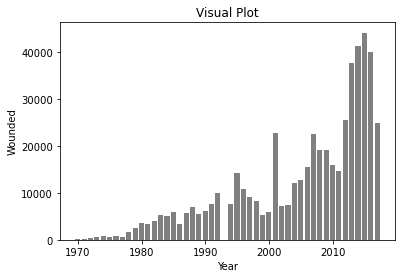

In [32]:
x1=df1['iyear'].unique()
y1=df1.groupby('iyear')['nwound'].sum()
plt.bar(x1,y1,color='grey')
plt.xlabel('Year')
plt.ylabel('Wounded')
plt.title('Visual Plot')
plt.show()
#Many people were wounded after year 2010

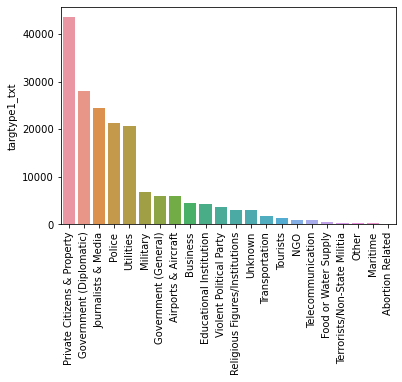

In [33]:
x1=df1['targtype1_txt'].unique()
y1=df1['targtype1_txt'].value_counts()
plt.xticks(rotation=90)
sns.barplot(x1,y1)
plt.show()
#Private Citizens/Property and Diplomatic Government are the frequent targets.

# Iraq is the hottest zone among the countries in the world facing terrorism.Region-wise,Middle East and North Africa are highest.Taliban is the most active terrorist group in the world.Private citizens,property and Government are their prime targets.Bombing/Explosion is the mode used the most by terrorists.After year 2010,there has been a significant rise in people killed or wounded due to terror strikes.Year 2014 witnessed the highest number of terror strikes,followed by 2015 and 2016.